PRACA DOMOWA 4
Stanisław Frelik

In [1]:
import numpy as np
from sklearn . datasets import make_blobs , make_circles , make_moons
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

In [62]:
# # Dane 1
n = 1500
X_1 , y_1 = make_blobs ( n_samples = n, random_state=9)

# # Dane 2
noise = 0.05
X_2 , y_2 = make_circles ( n_samples = n , factor = 0.5 , noise = noise )

# # Dane 3
noise = 0.05
X_3 , y_3 = make_moons ( n_samples = n , noise = noise )
# # Dane 4
X_4 = np . random . rand (n , 2)

-------------------

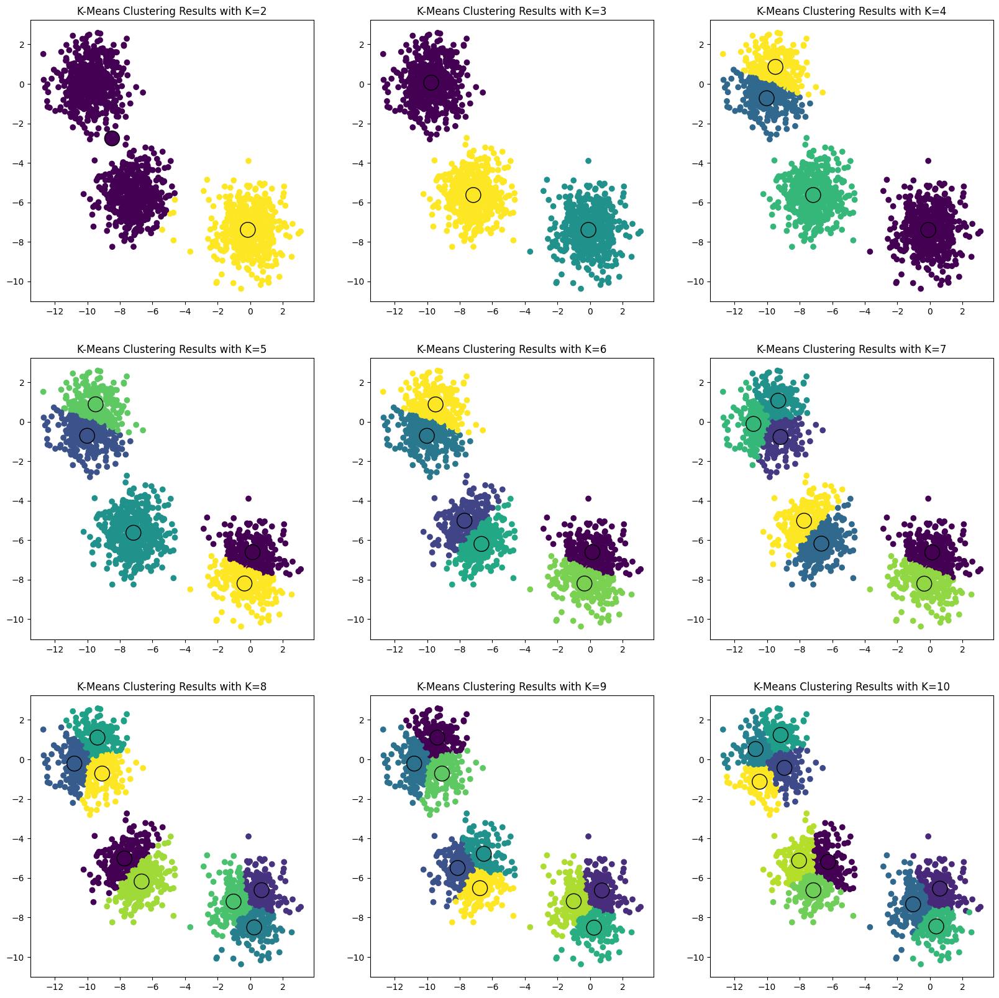

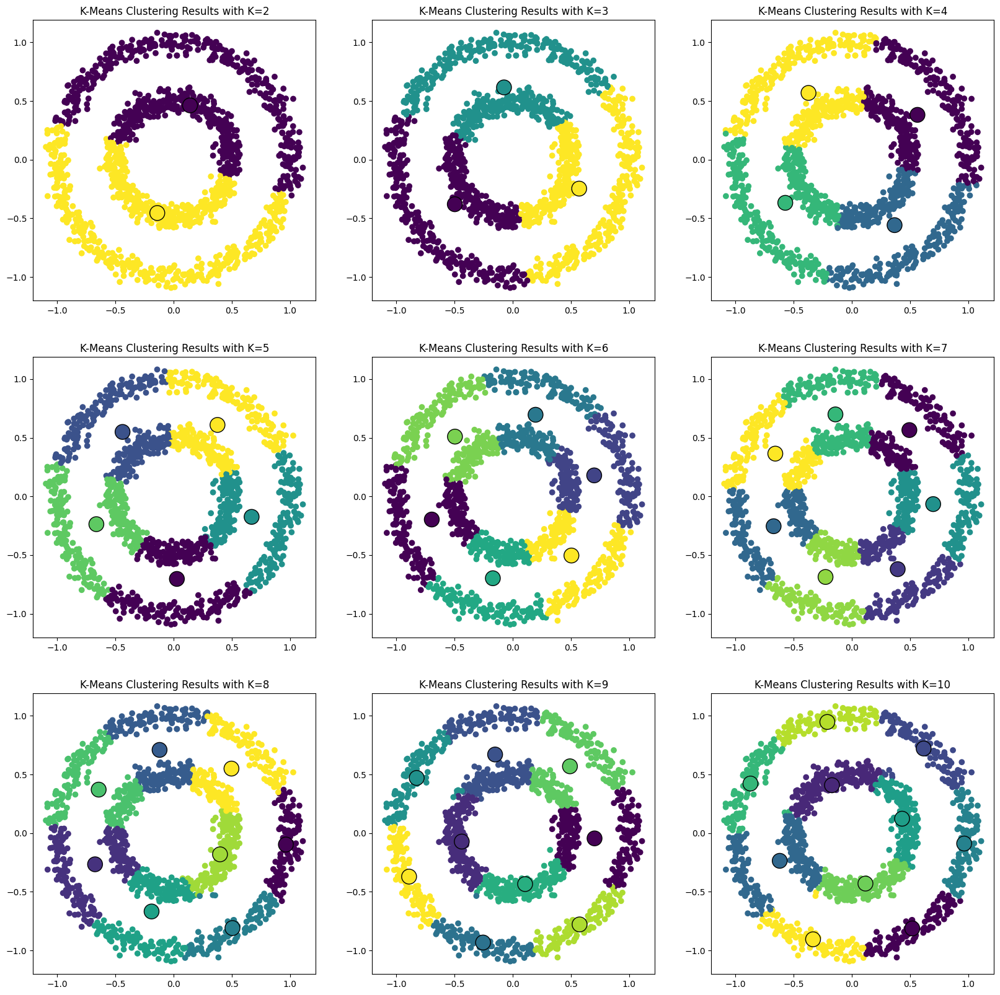

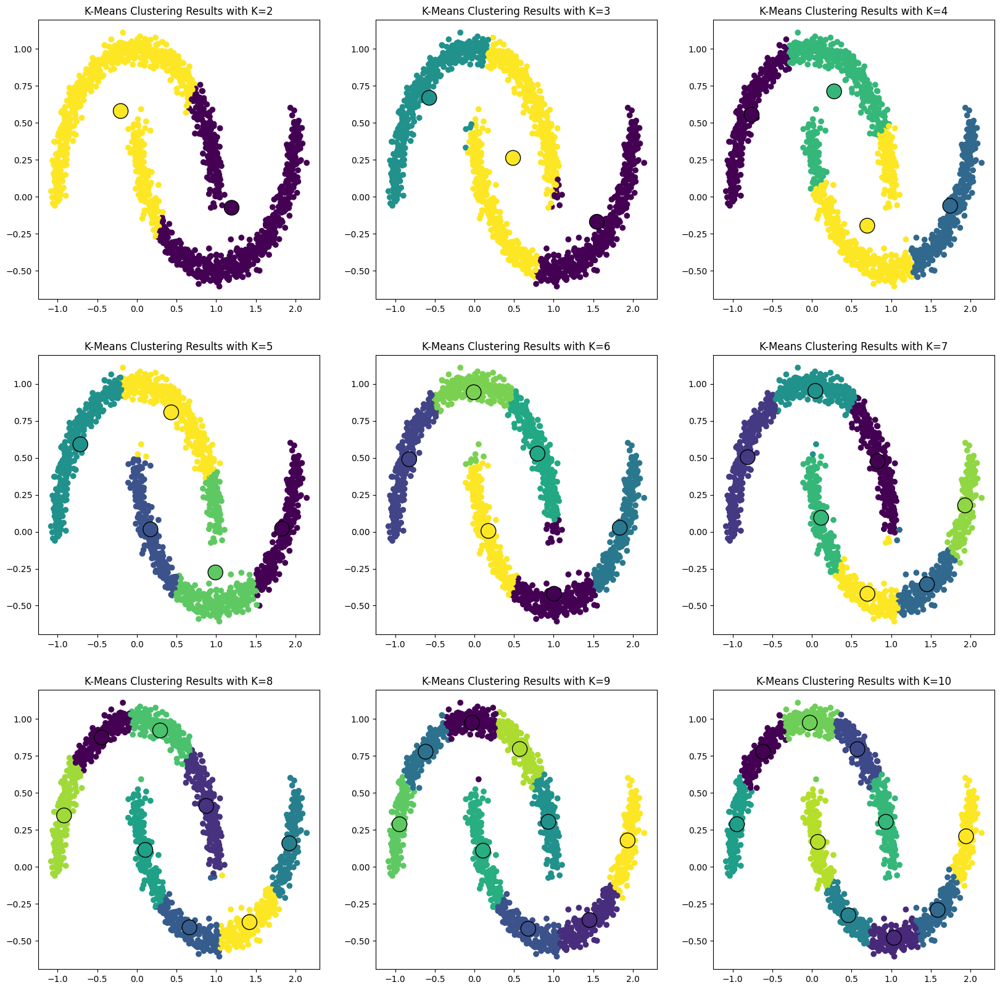

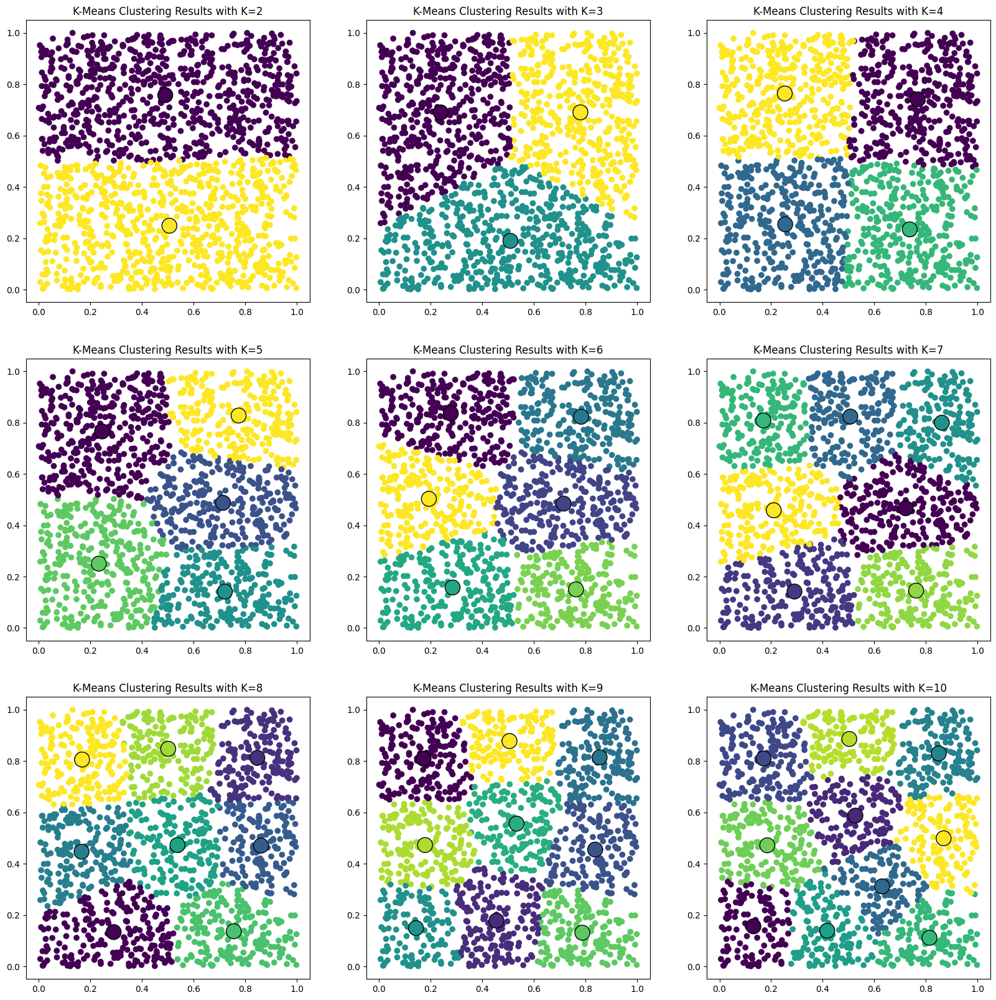

In [64]:
i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    kmeans = KMeans(n_clusters = k,
                random_state = 2,
                n_init = 20).fit(X_1)
    axs[i][j].scatter(X_1[:,0], X_1[:,1], c = kmeans.labels_)
    axs[i][j].set_title(f"K-Means Clustering Results with K={k}")
    axs[i][j].scatter(kmeans.cluster_centers_[:,0], 
                      kmeans.cluster_centers_[:,1], 
                      c = np.unique(kmeans.labels_), 
                      edgecolors="black", s=300)
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('KM_blobs.png')

##########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    kmeans = KMeans(n_clusters = k,
                random_state = 2,
                n_init = 20).fit(X_2)
    axs[i][j].scatter(X_2[:,0], X_2[:,1], c = kmeans.labels_)
    axs[i][j].set_title(f"K-Means Clustering Results with K={k}")
    axs[i][j].scatter(kmeans.cluster_centers_[:,0], 
                      kmeans.cluster_centers_[:,1], 
                      c = np.unique(kmeans.labels_), 
                      edgecolors="black", s=300)
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('KM_circles.png')

##########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    kmeans = KMeans(n_clusters = k,
                random_state = 2,
                n_init = 20).fit(X_3)
    axs[i][j].scatter(X_3[:,0], X_3[:,1], c = kmeans.labels_)
    axs[i][j].set_title(f"K-Means Clustering Results with K={k}")
    axs[i][j].scatter(kmeans.cluster_centers_[:,0], 
                      kmeans.cluster_centers_[:,1], 
                      c = np.unique(kmeans.labels_), 
                      edgecolors="black", s=300)
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('KM_moons.png')

##########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    kmeans = KMeans(n_clusters = k,
                random_state = 2,
                n_init = 20).fit(X_4)
    axs[i][j].scatter(X_4[:,0], X_4[:,1], c = kmeans.labels_)
    axs[i][j].set_title(f"K-Means Clustering Results with K={k}")
    axs[i][j].scatter(kmeans.cluster_centers_[:,0], 
                      kmeans.cluster_centers_[:,1], 
                      c = np.unique(kmeans.labels_), 
                      edgecolors="black", s=300)
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('KM_random.png')

-------------

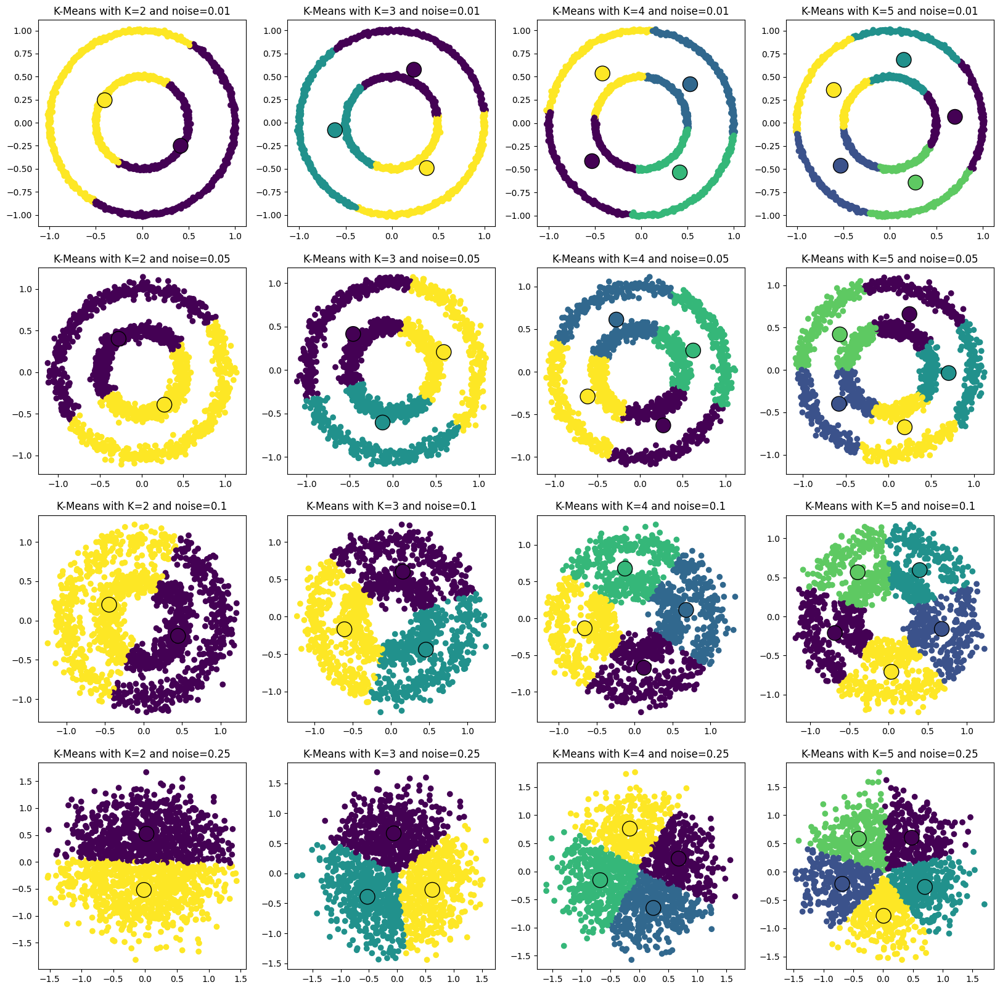

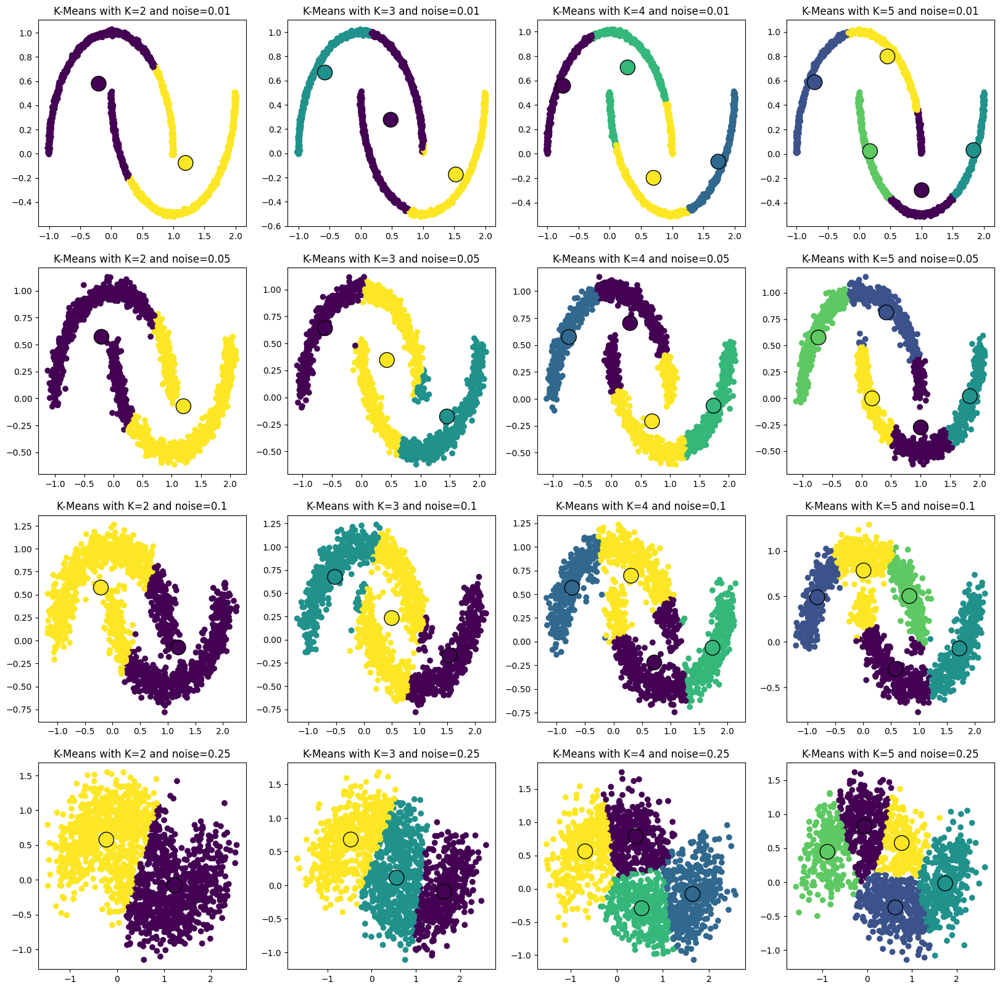

In [65]:
noise_list = list((0.01, 0.05, 0.1, 0.25))
cluster_list = list((2, 3, 4, 5))

####################################################################

i,j=0,0
fig, axs = plt.subplots(4,4, figsize=(20, 20))
for k in range(2, 18):
    X_2 , y_2 = make_circles ( n_samples = 1500 , factor = 0.5 , noise = noise_list[i] )
    kmeans = KMeans(n_clusters = cluster_list[j],
                random_state = 2,
                n_init = 20).fit(X_2)
    axs[i][j].scatter(X_2[:,0], X_2[:,1], c = kmeans.labels_)
    axs[i][j].set_title(f"K-Means with K={cluster_list[j]} and noise={noise_list[i]}")
    axs[i][j].scatter(kmeans.cluster_centers_[:,0], 
                      kmeans.cluster_centers_[:,1], 
                      c = np.unique(kmeans.labels_), 
                      edgecolors="black", s=300)
    j+=1
    if j%4==0:
        i+=1
        j=0

plt.savefig('KM_noise_circles.png')

####################################################################

i,j=0,0
fig, axs = plt.subplots(4,4, figsize=(20, 20))
for k in range(2, 18):
    X_3 , y_3 = make_moons ( n_samples = 1500 , noise = noise_list[i] )
    kmeans = KMeans(n_clusters = cluster_list[j],
                random_state = 2,
                n_init = 20).fit(X_3)
    axs[i][j].scatter(X_3[:,0], X_3[:,1], c = kmeans.labels_)
    axs[i][j].set_title(f"K-Means with K={cluster_list[j]} and noise={noise_list[i]}")
    axs[i][j].scatter(kmeans.cluster_centers_[:,0], 
                      kmeans.cluster_centers_[:,1], 
                      c = np.unique(kmeans.labels_), 
                      edgecolors="black", s=300)
    j+=1
    if j%4==0:
        i+=1
        j=0

plt.savefig('KM_noise_moons.png')

-------------------

In [66]:
scaler = MinMaxScaler(feature_range = (-1, 1))
# # Dane 1
n = 1500
X_1 , y_1 = make_blobs ( n_samples = n, random_state=9)
X_1 = scaler.fit(X_1).transform(X_1)
# # Dane 2
noise = 0.05
X_2 , y_2 = make_circles ( n_samples = n , factor = 0.5 , noise = noise )
X_2 = scaler.fit(X_2).transform(X_2)
# # Dane 3
noise = 0.05
X_3 , y_3 = make_moons ( n_samples = n , noise = noise )
X_3 = scaler.fit(X_3).transform(X_3)
# # Dane 4
X_4 = np . random . rand (n , 2)
X_4 = scaler.fit(X_4).transform(X_4)

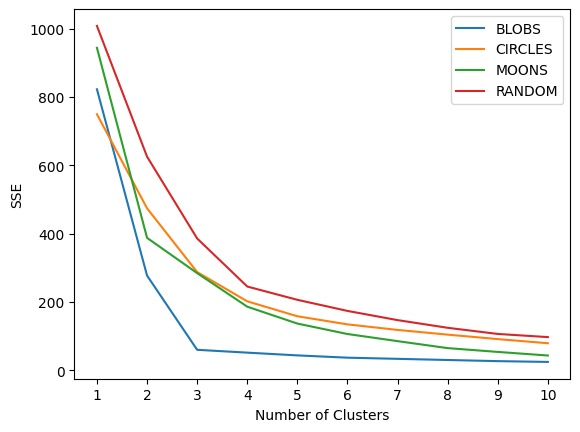

In [67]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters = k, random_state = 2, n_init = 20).fit(X_1)
    sse.append(kmeans.inertia_)
plt.plot(range(1,11),sse, label = "BLOBS")

##################################################################

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters = k, random_state = 2, n_init = 20).fit(X_2)
    sse.append(kmeans.inertia_)
plt.plot(range(1,11),sse, label = "CIRCLES")

##################################################################

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters = k, random_state = 2, n_init = 20).fit(X_3)
    sse.append(kmeans.inertia_)
plt.plot(range(1,11),sse, label = "MOONS")

##################################################################

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters = k, random_state = 2, n_init = 20).fit(X_4)
    sse.append(kmeans.inertia_)
plt.plot(range(1,11),sse, label = "RANDOM")

##################################################################

plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.legend()

plt.savefig('KM_score.png')

---------------------------------------

In [68]:
# # Dane 1
n = 1500
X_1 , y_1 = make_blobs ( n_samples = n, random_state=9)

# # Dane 2
noise = 0.05
X_2 , y_2 = make_circles ( n_samples = n , factor = 0.5 , noise = noise )

# # Dane 3
noise = 0.05
X_3 , y_3 = make_moons ( n_samples = n , noise = noise )
# # Dane 4
X_4 = np . random . rand (n , 2)

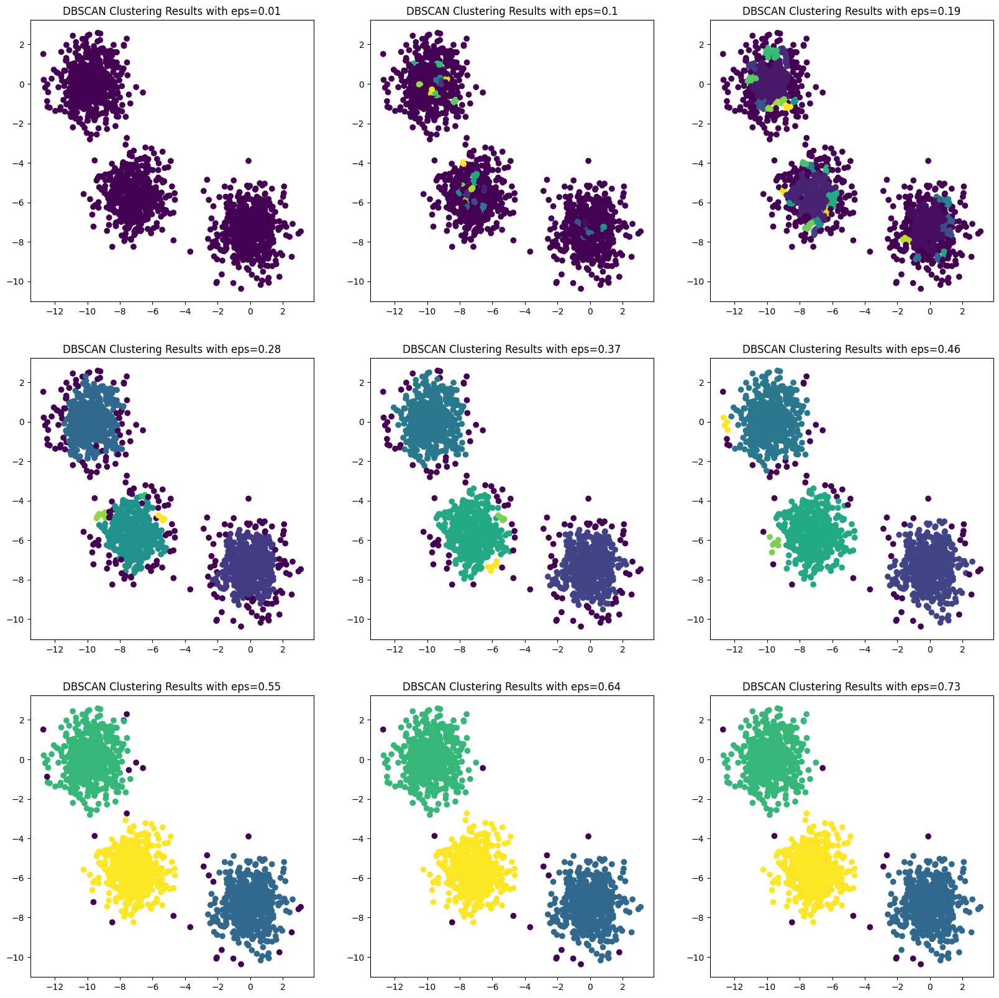

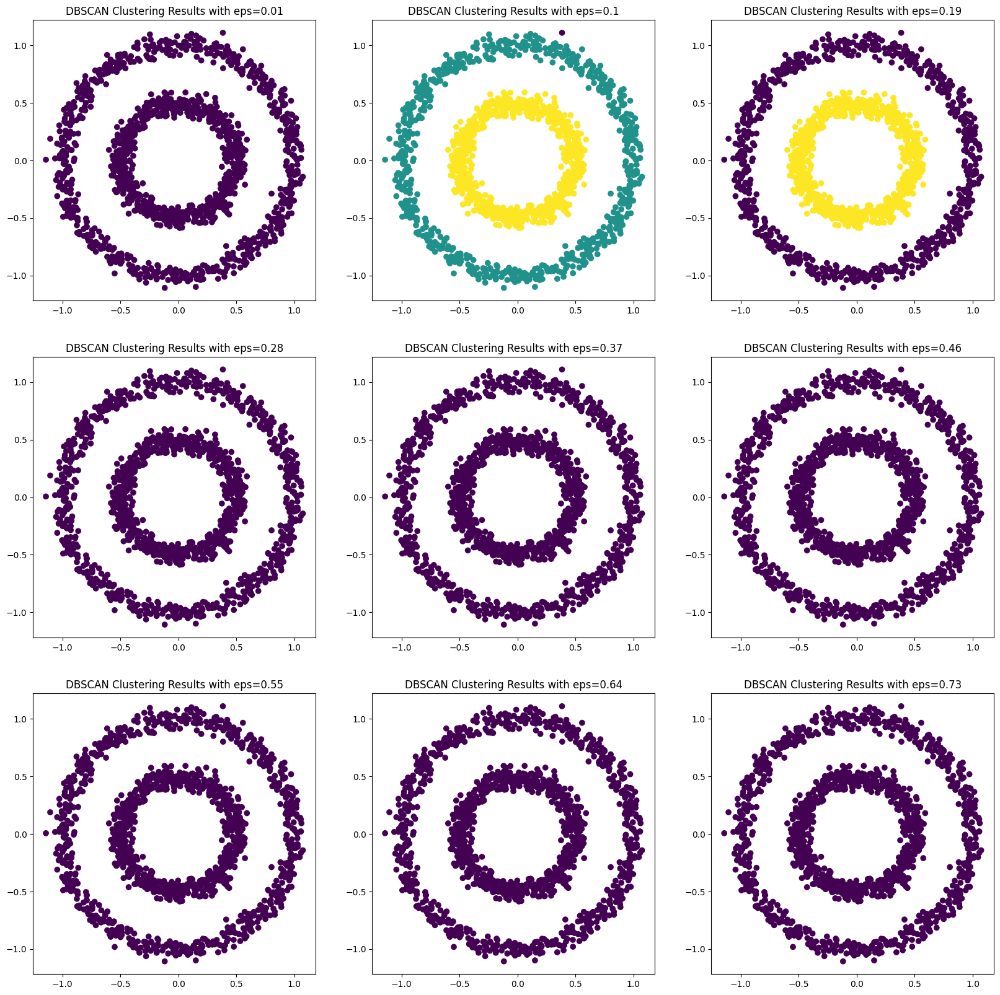

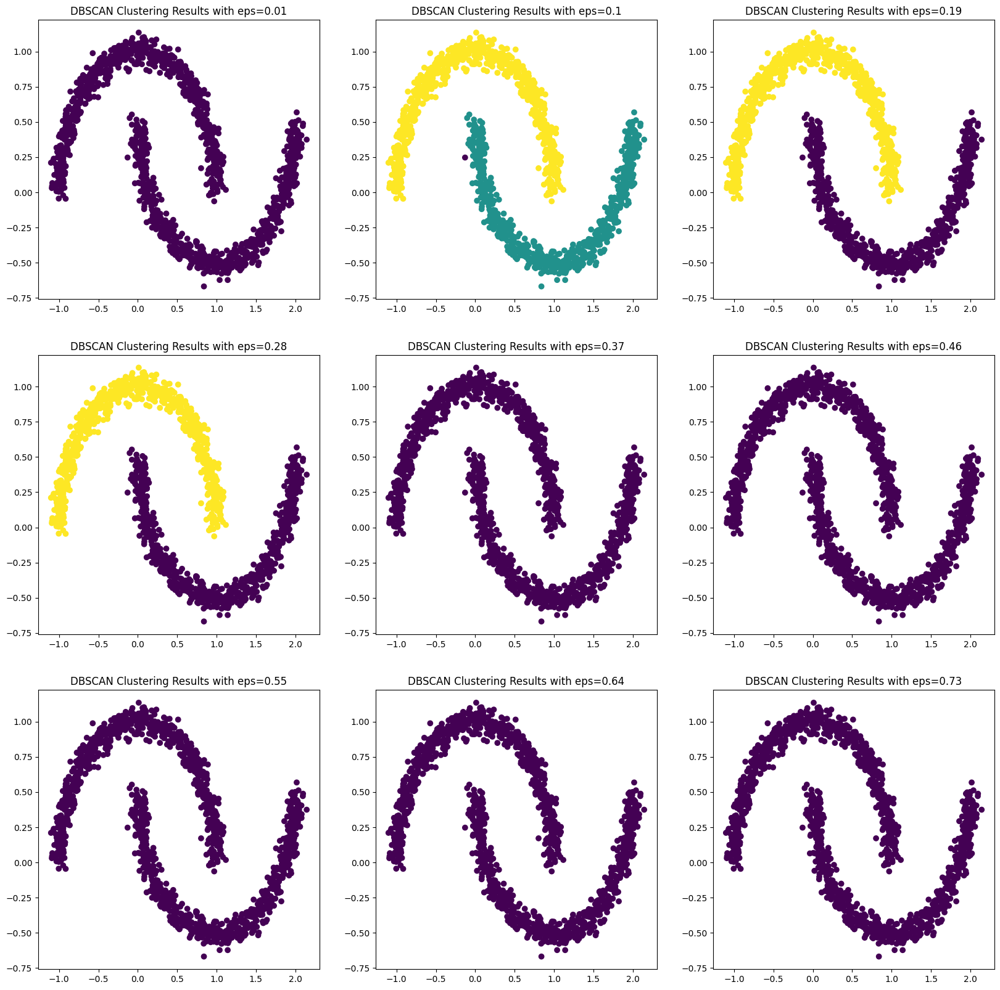

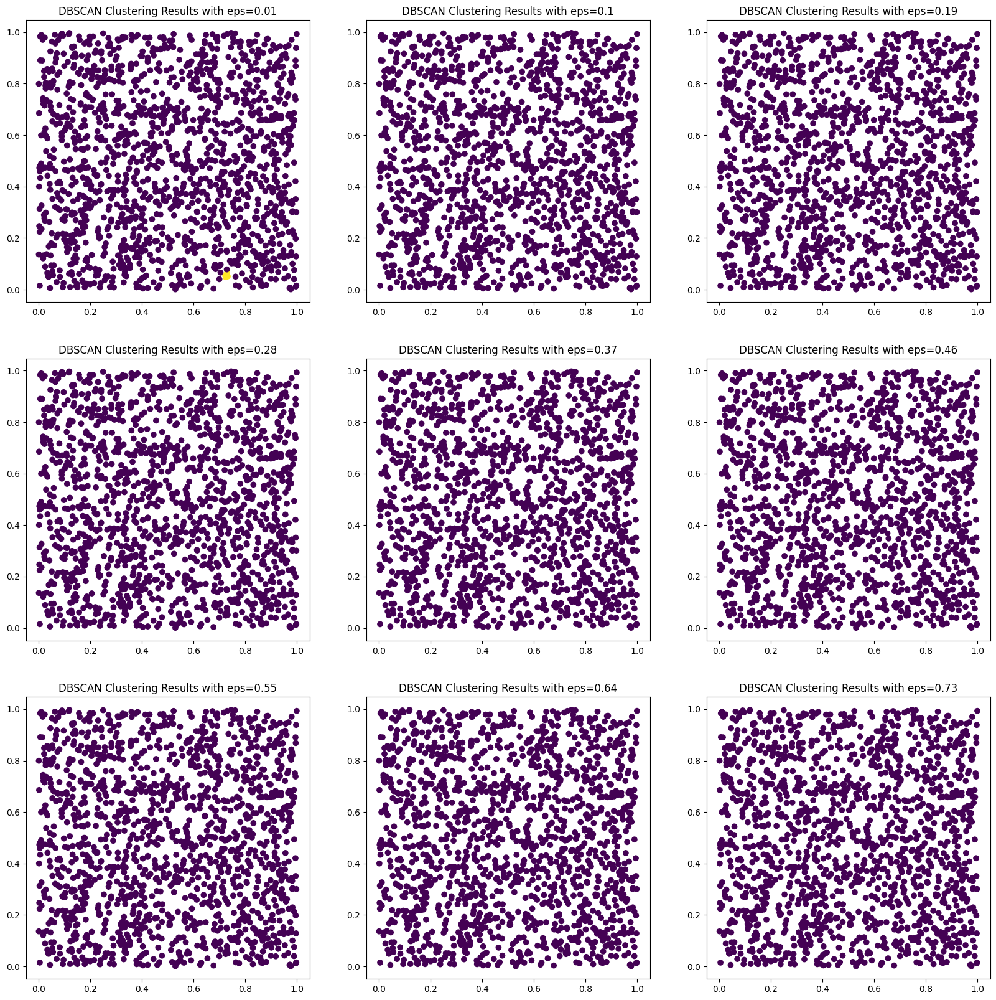

In [69]:
eps = list(range(1, 75, 9))

#########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_1)
    axs[i][j].scatter(X_1[:,0], X_1[:,1], c = DB.labels_)
    axs[i][j].set_title(f"DBSCAN Clustering Results with eps={eps[k - 2]/100}")

    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('DB_blobs.png')

#########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_2)
    axs[i][j].scatter(X_2[:,0], X_2[:,1], c = DB.labels_)
    axs[i][j].set_title(f"DBSCAN Clustering Results with eps={eps[k - 2]/100}")

    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('DB_circles.png')

#########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_3)
    axs[i][j].scatter(X_3[:,0], X_3[:,1], c = DB.labels_)
    axs[i][j].set_title(f"DBSCAN Clustering Results with eps={eps[k - 2]/100}")

    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('DB_moons.png')

#########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_4)
    axs[i][j].scatter(X_4[:,0], X_4[:,1], c = DB.labels_)
    axs[i][j].set_title(f"DBSCAN Clustering Results with eps={eps[k - 2]/100}")

    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('DB_random.png')

-------------------------------------------------------------------------

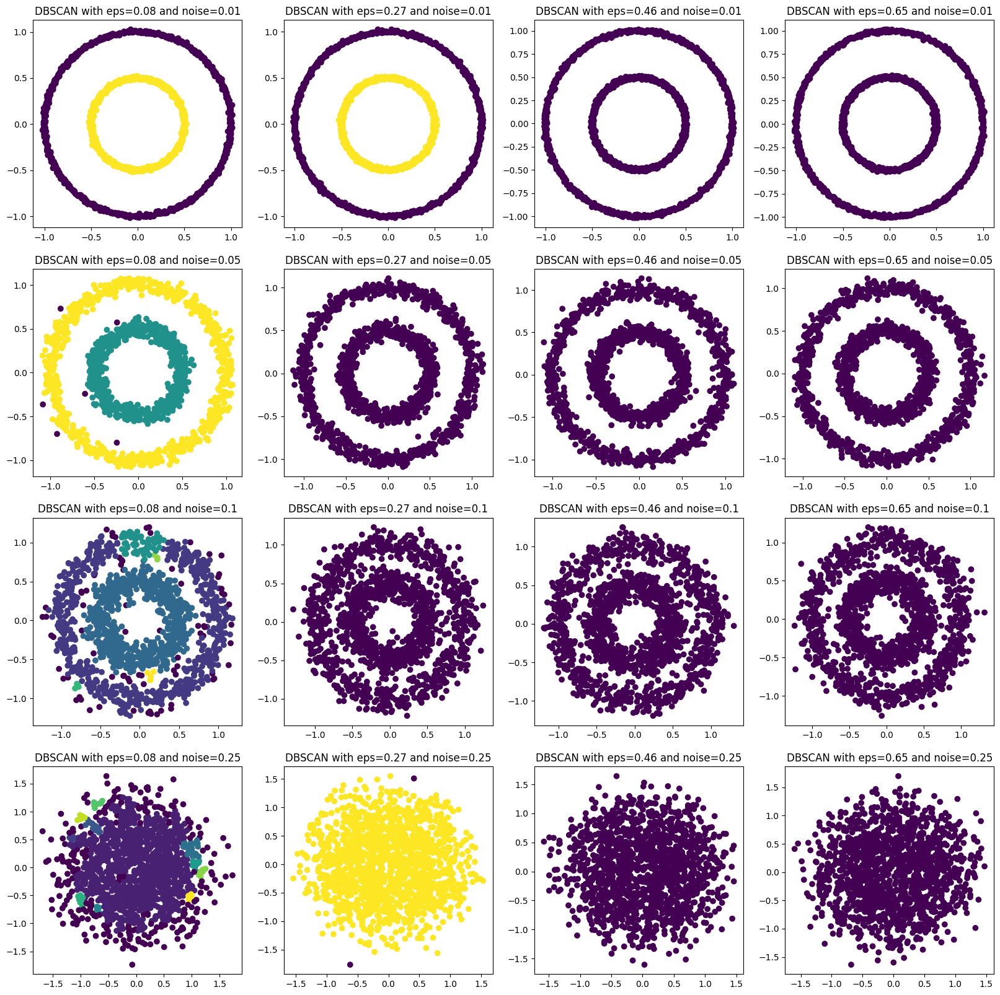

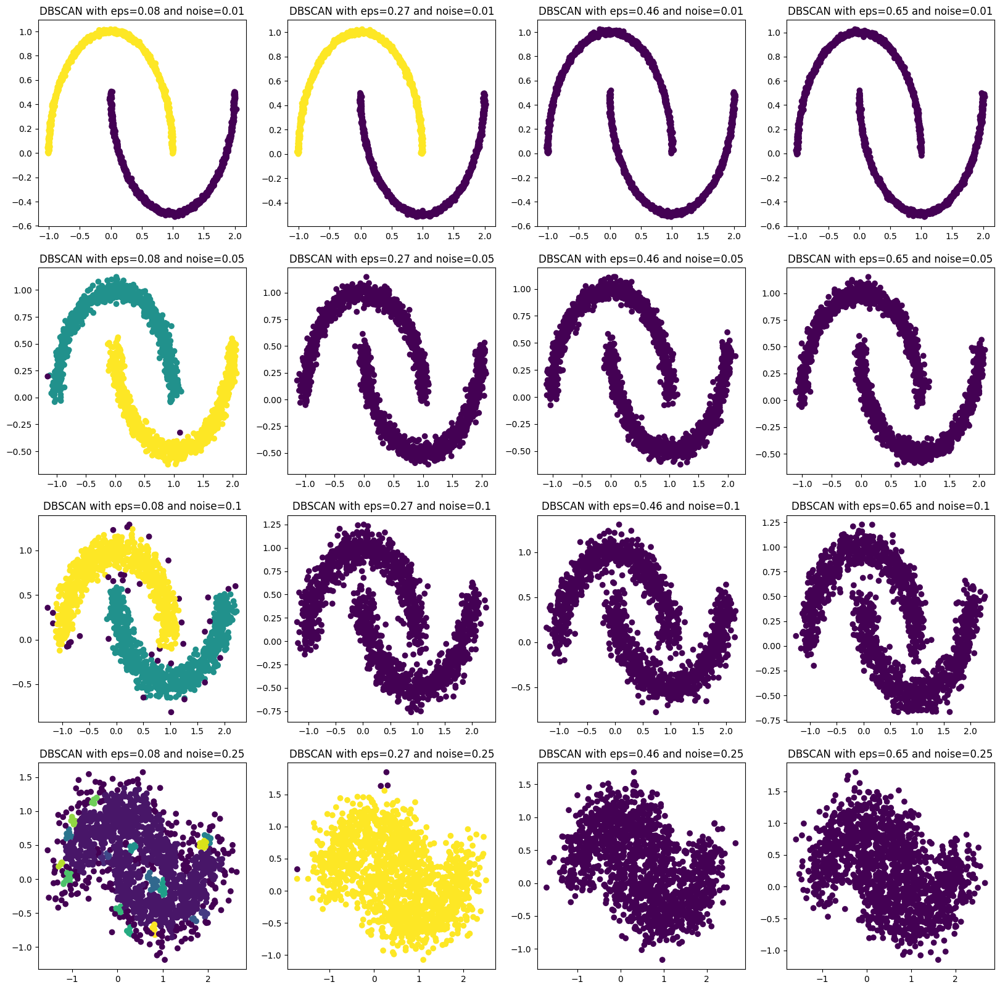

In [70]:
noise_list = list((0.01, 0.05, 0.1, 0.25))
eps = list(range(8, 75, 19))

####################################################################

i,j=0,0
fig, axs = plt.subplots(4,4, figsize=(20, 20))
for k in range(2, 18):
    X_2 , y_2 = make_circles ( n_samples = 1500 , factor = 0.5 , noise = noise_list[i] )
    DB = DBSCAN(eps = eps[j]/100).fit(X_2)
    axs[i][j].scatter(X_2[:,0], X_2[:,1], c = DB.labels_)
    axs[i][j].set_title(f"DBSCAN with eps={eps[j]/100} and noise={noise_list[i]}")
    j+=1
    if j%4==0:
        i+=1
        j=0

plt.savefig('DB_noise_circles.png')

####################################################################

i,j=0,0
fig, axs = plt.subplots(4,4, figsize=(20, 20))
for k in range(2, 18):
    X_3 , y_3 = make_moons ( n_samples = 1500 , noise = noise_list[i] )
    DB = DBSCAN(eps = eps[j]/100).fit(X_3)
    axs[i][j].scatter(X_3[:,0], X_3[:,1], c = DB.labels_)
    axs[i][j].set_title(f"DBSCAN with eps={eps[j]/100} and noise={noise_list[i]}")
    j+=1
    if j%4==0:
        i+=1
        j=0

plt.savefig('DB_noise_moons.png')

In [71]:
scaler = MinMaxScaler(feature_range = (-1, 1))
# # Dane 1
n = 1500
X_1 , y_1 = make_blobs ( n_samples = n, random_state=9)
X_1 = scaler.fit(X_1).transform(X_1)
# # Dane 2
noise = 0.05
X_2 , y_2 = make_circles ( n_samples = n , factor = 0.5 , noise = noise )
X_2 = scaler.fit(X_2).transform(X_2)
# # Dane 3
noise = 0.05
X_3 , y_3 = make_moons ( n_samples = n , noise = noise )
X_3 = scaler.fit(X_3).transform(X_3)
# # Dane 4
X_4 = np . random . rand (n , 2)
X_4 = scaler.fit(X_4).transform(X_4)

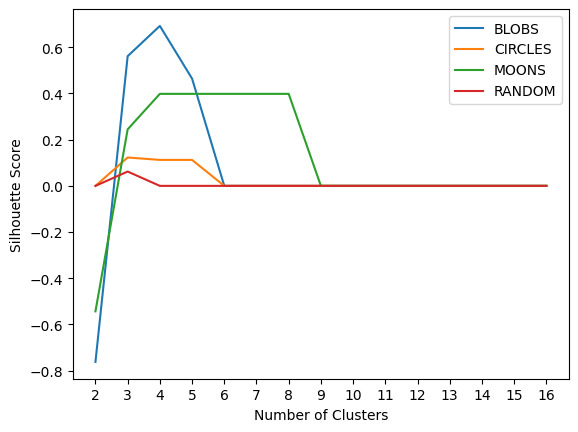

In [73]:
eps = list(range(1, 75, 5))

#################################################################

silk = []
for k in range(2, 17):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_1)
    if np.all(DB.labels_ == 0):
        silk.append(0)
    elif np.all(DB.labels_ == -1):
        silk.append(0)
    else:
        silk.append(silhouette_score(X_1, labels=DB.labels_))
plt.plot(range(2,17),silk, label = "BLOBS")

##################################################################

silk = []
for k in range(2, 17):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_2)
    if np.all(DB.labels_ == 0):
        silk.append(0)
    elif np.all(DB.labels_ == -1):
        silk.append(0)
    else:
        silk.append(silhouette_score(X_2, labels=DB.labels_))
plt.plot(range(2,17),silk, label = "CIRCLES")

##################################################################

silk = []
for k in range(2, 17):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_3)
    if np.all(DB.labels_ == 0):
        silk.append(0)
    elif np.all(DB.labels_ == -1):
        silk.append(0)
    else:
        silk.append(silhouette_score(X_3, labels=DB.labels_))
plt.plot(range(2,17),silk, label = "MOONS")

##################################################################

silk = []
for k in range(2, 17):
    DB = DBSCAN(eps = eps[k - 2]/100).fit(X_4)
    if np.all(DB.labels_ == 0):
        silk.append(0)
    elif np.all(DB.labels_ == -1):
        silk.append(0)
    else:
        silk.append(silhouette_score(X_4, labels=DB.labels_))
plt.plot(range(2,17),silk, label = "RANDOM")

##################################################################

plt.xticks(range(2, 17))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.legend()

plt.savefig('DB_score.png')

-----------------------

In [74]:
# # Dane 1
n = 1500
X_1 , y_1 = make_blobs ( n_samples = n, random_state=9)

# # Dane 2
noise = 0.05
X_2 , y_2 = make_circles ( n_samples = n , factor = 0.5 , noise = noise )

# # Dane 3
noise = 0.05
X_3 , y_3 = make_moons ( n_samples = n , noise = noise )
# # Dane 4
X_4 = np . random . rand (n , 2)

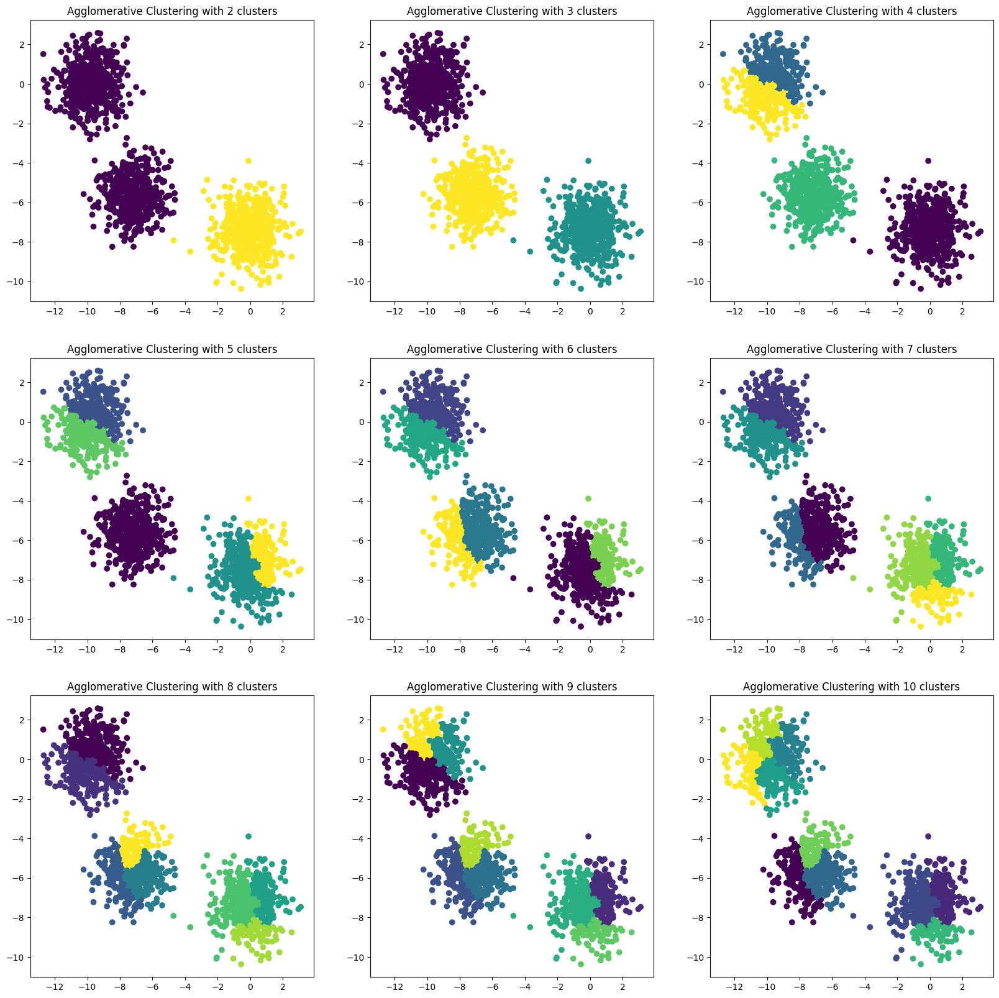

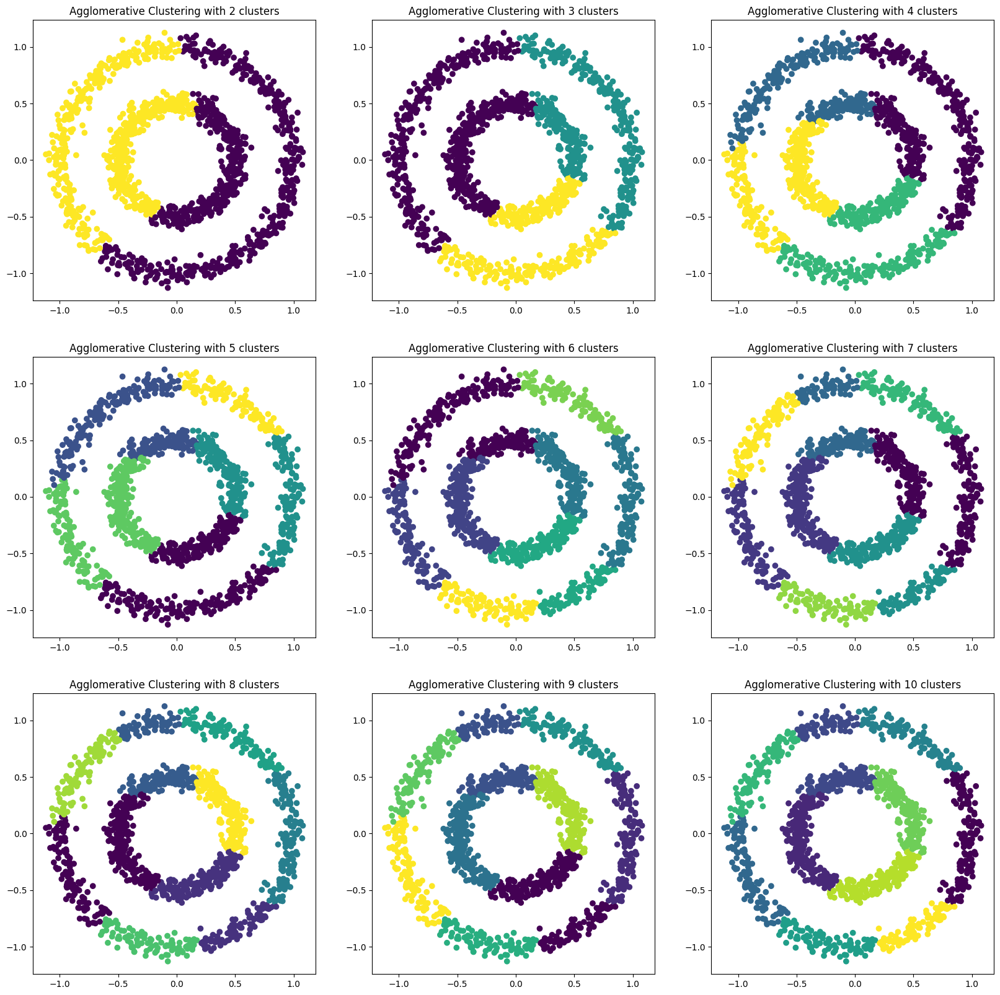

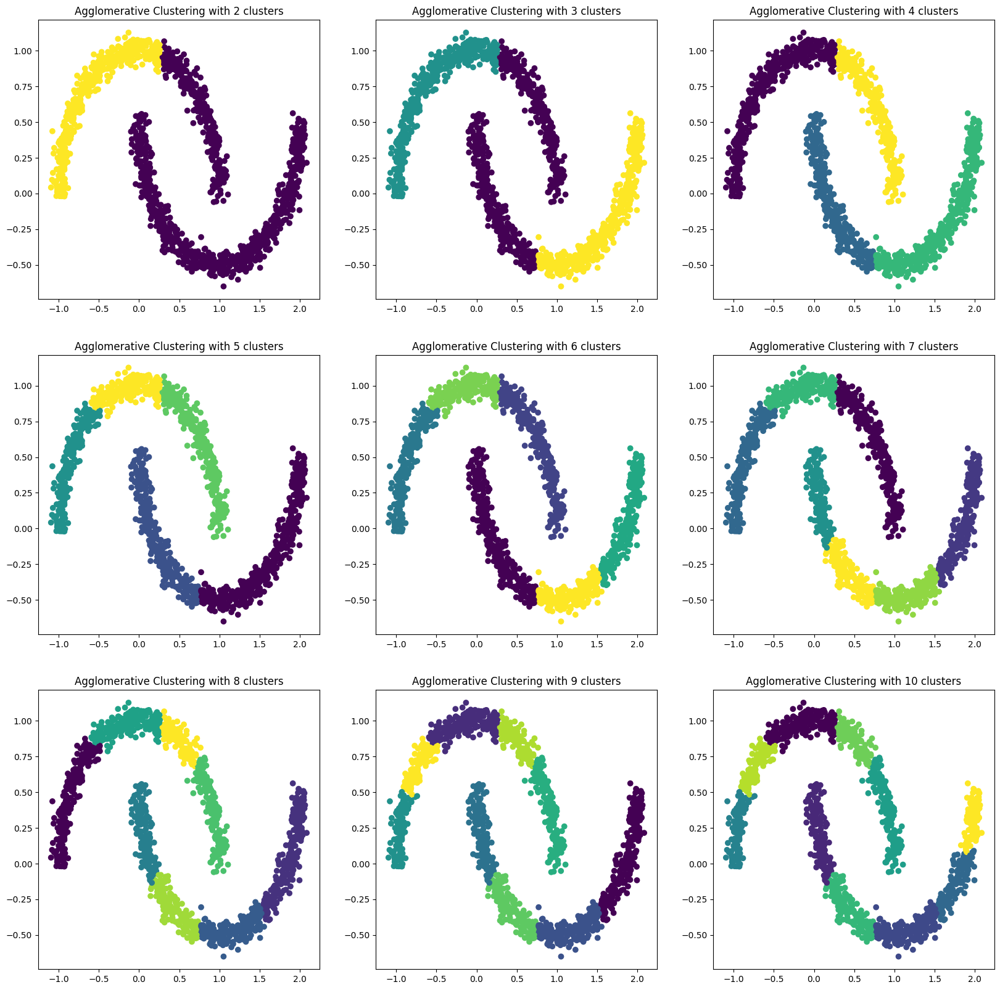

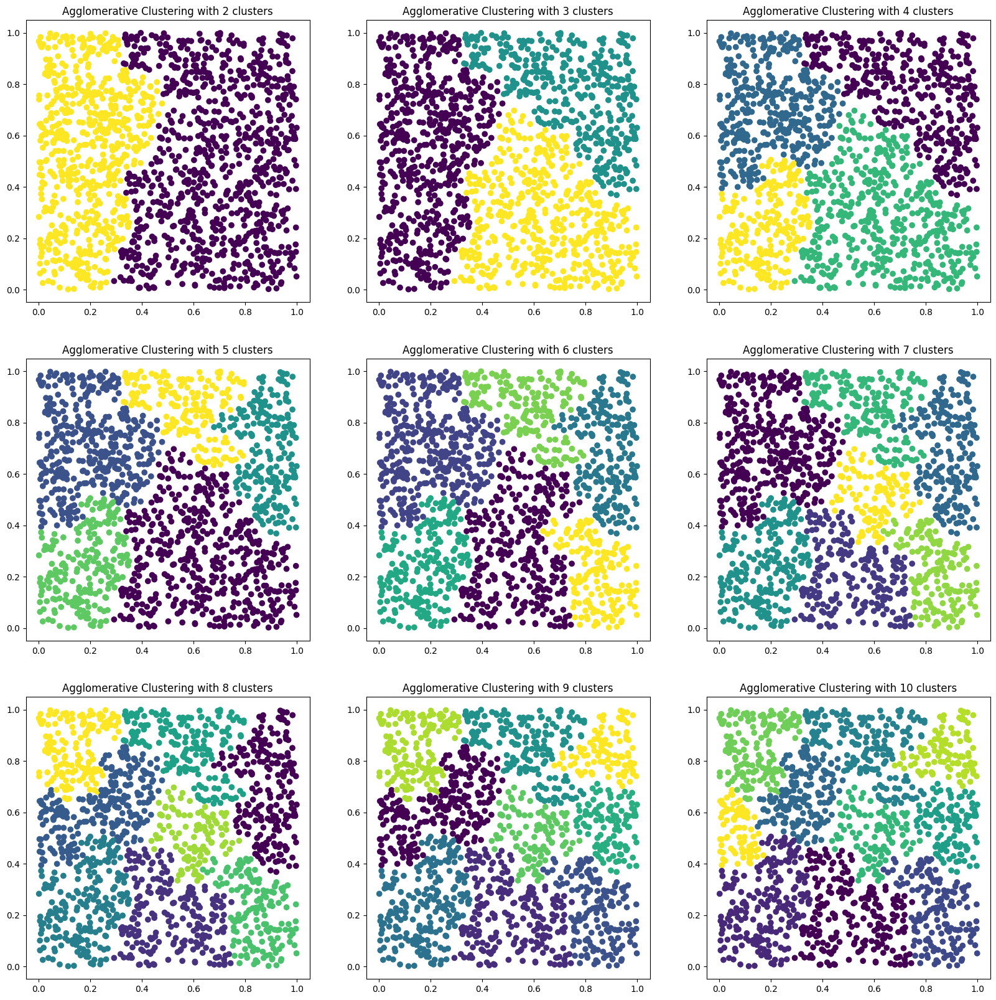

In [75]:
i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_1)
    axs[i][j].scatter(X_1[:,0], X_1[:,1], c = AG.labels_)
    axs[i][j].set_title(f"Agglomerative Clustering with {k} clusters")
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('AG_blobs.png')

##########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_2)
    axs[i][j].scatter(X_2[:,0], X_2[:,1], c = AG.labels_)
    axs[i][j].set_title(f"Agglomerative Clustering with {k} clusters")
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('AG_circles.png')

##########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_3)
    axs[i][j].scatter(X_3[:,0], X_3[:,1], c = AG.labels_)
    axs[i][j].set_title(f"Agglomerative Clustering with {k} clusters")
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('AG_moons.png')

##########################################################################

i,j=0,0
fig, axs = plt.subplots(3,3, figsize=(20, 20))
for k in range(2, 11):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_4)
    axs[i][j].scatter(X_4[:,0], X_4[:,1], c = AG.labels_)
    axs[i][j].set_title(f"Agglomerative Clustering with {k} clusters")
    j+=1
    if j%3==0:
        i+=1
        j=0

plt.savefig('AG_random.png')

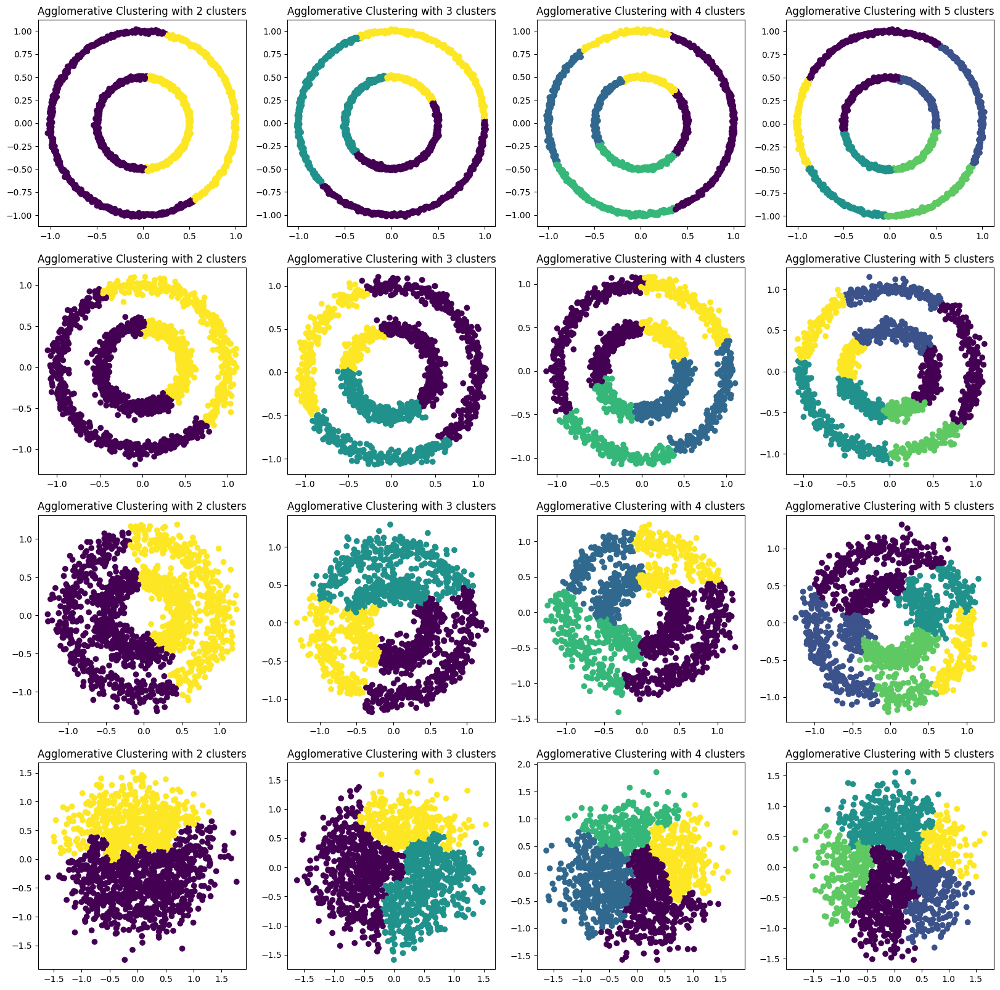

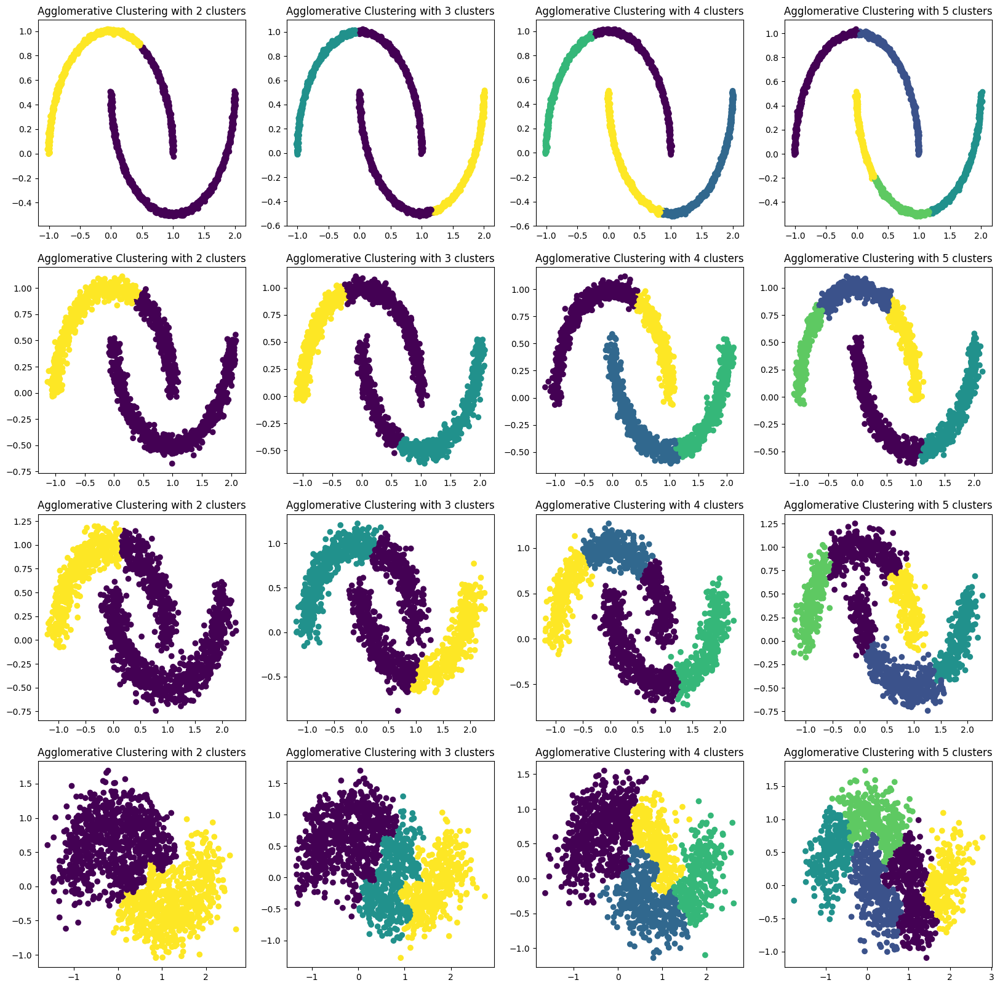

In [4]:
noise_list = list((0.01, 0.05, 0.1, 0.25))

####################################################################

i,j=0,0
fig, axs = plt.subplots(4,4, figsize=(20, 20))
for k in range(2, 18):
    X_2 , y_2 = make_circles ( n_samples = 1500 , factor = 0.5 , noise = noise_list[i] )
    AG = AgglomerativeClustering(n_clusters=j + 2).fit(X_2)
    axs[i][j].scatter(X_2[:,0], X_2[:,1], c = AG.labels_)
    axs[i][j].set_title(f"Agglomerative Clustering with {j + 2} clusters")
    j+=1
    if j%4==0:
        i+=1
        j=0

plt.savefig('test1.png')

####################################################################

i,j=0,0
fig, axs = plt.subplots(4,4, figsize=(20, 20))
for k in range(2, 18):
    X_3 , y_2 = make_moons ( n_samples = 1500 , noise = noise_list[i] )
    AG = AgglomerativeClustering(n_clusters=j + 2).fit(X_3)
    axs[i][j].scatter(X_3[:,0], X_3[:,1], c = AG.labels_)
    axs[i][j].set_title(f"Agglomerative Clustering with {j + 2} clusters")
    j+=1
    if j%4==0:
        i+=1
        j=0

plt.savefig('test2.png')

------------------

In [77]:
scaler = MinMaxScaler(feature_range = (-1, 1))
# # Dane 1
n = 1500
X_1 , y_1 = make_blobs ( n_samples = n, random_state=9)
X_1 = scaler.fit(X_1).transform(X_1)
# # Dane 2
noise = 0.05
X_2 , y_2 = make_circles ( n_samples = n , factor = 0.5 , noise = noise )
X_2 = scaler.fit(X_2).transform(X_2)
# # Dane 3
noise = 0.05
X_3 , y_3 = make_moons ( n_samples = n , noise = noise )
X_3 = scaler.fit(X_3).transform(X_3)
# # Dane 4
X_4 = np . random . rand (n , 2)
X_4 = scaler.fit(X_4).transform(X_4)

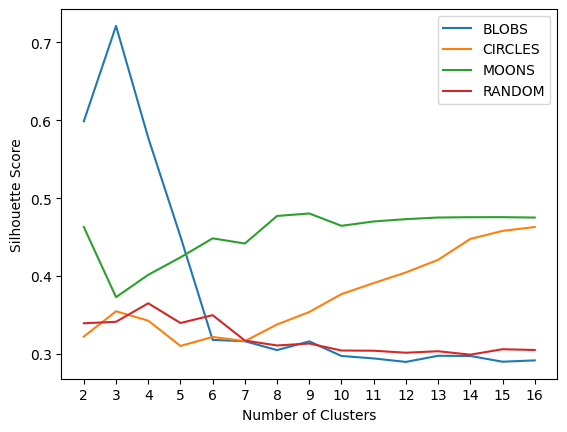

In [78]:
silk = []
for k in range(2, 17):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_1)
    silk.append(silhouette_score(X_1, labels=AG.labels_))
plt.plot(range(2,17),silk, label = "BLOBS")

##################################################################

silk = []
for k in range(2, 17):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_2)
    silk.append(silhouette_score(X_2, labels=AG.labels_))
plt.plot(range(2,17),silk, label = "CIRCLES")

##################################################################

silk = []
for k in range(2, 17):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_3)
    silk.append(silhouette_score(X_3, labels=AG.labels_))
plt.plot(range(2,17),silk, label = "MOONS")

##################################################################

silk = []
for k in range(2, 17):
    AG = AgglomerativeClustering(n_clusters = k).fit(X_4)
    silk.append(silhouette_score(X_4, labels=AG.labels_))
plt.plot(range(2,17),silk, label = "RANDOM")

##################################################################

plt.xticks(range(2, 17))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.legend()

plt.savefig('AG_score.png')